## Parking Lot Classifier

In [1]:
import os

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input

tf.__version__

'2.3.1'

In [2]:
DATA_LIST = os.listdir('two/train')
TEST_DIR =  'two/test'
IMAGE_SIZE    = (224, 224)
NUM_CLASSES   = len(DATA_LIST)
BATCH_SIZE    = 10
NUM_EPOCHS    = 30
LEARNING_RATE = 0.0001

In [3]:
train_datagen = ImageDataGenerator(rescale=1./255,rotation_range=50,featurewise_center = True,
                                   featurewise_std_normalization = False,width_shift_range=0.2,
                                   height_shift_range=0.2,shear_range=0.25,zoom_range=0.1,
                                   zca_whitening = True,channel_shift_range = 20,
                                   horizontal_flip = True,vertical_flip = True,
                                   validation_split = 0.2,fill_mode='constant')

train_batches = train_datagen.flow_from_directory('two/train',target_size=IMAGE_SIZE,
                                                  shuffle=True,batch_size=BATCH_SIZE,
                                                  subset = "training",seed=42,
                                                  class_mode="binary")

valid_batches = train_datagen.flow_from_directory('two/train',target_size=IMAGE_SIZE,
                                                  shuffle=True,batch_size=BATCH_SIZE,
                                                  subset = "validation",seed=42,
                                                  class_mode="binary")

Found 180 images belonging to 2 classes.
Found 44 images belonging to 2 classes.


In [4]:
from tensorflow.keras.applications import VGG16, VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, AveragePooling2D

vgg_16 = VGG16(include_top=False,weights='imagenet',input_shape=(224,224,3))
vgg_16.trainable = True

fine_tune = len(vgg_16.layers)-2
print(fine_tune)
for layer in vgg_16.layers[:fine_tune]:
    layer.trainable =  False
    
pl_model = Sequential()
pl_model.add(vgg_16)
pl_model.add(Flatten())
pl_model.add(Dropout(0.5))
pl_model.add(Dense(256,activation="relu",name="dense_feature"))
pl_model.add(Dropout(0.5))
pl_model.add(Dense(1,activation="sigmoid"))

pl_model.summary()


17
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 25088)             0         
_________________________________________________________________
dropout (Dropout)            (None, 25088)             0         
_________________________________________________________________
dense_feature (Dense)        (None, 256)               6422784   
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense (Dense)                (None, 1)                 257       
Total params: 21,137,729
Trainable params: 8,782,849
Non-trainable params: 12,354,880
_________________________________

In [19]:
print(len(train_batches))
print(len(valid_batches))

STEP_SIZE_TRAIN=train_batches.n//train_batches.batch_size
STEP_SIZE_VALID=valid_batches.n//valid_batches.batch_size


# lrs = tf.keras.optimizers.schedules.InverseTimeDecay(
#           LEARNING_RATE,
#           decay_steps=STEP_SIZE_TRAIN*10,
#           decay_rate=1,
#           staircase=False)

opt = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)

pl_model.compile(optimizer=opt,
                    loss="binary_crossentropy", 
                    metrics=['accuracy'])
history = pl_model.fit(train_batches, 
                          steps_per_epoch=STEP_SIZE_TRAIN, 
                          epochs=NUM_EPOCHS, 
                          validation_data=valid_batches, 
                          validation_steps=STEP_SIZE_VALID)

18
5
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 18 steps, validate for 4 steps
Epoch 1/30


/opt/anaconda3/lib/python3.7/site-packages/keras_preprocessing/image/image_data_generator.py:716: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/opt/anaconda3/lib/python3.7/site-packages/keras_preprocessing/image/image_data_generator.py:735: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


18/18 [==============================] - 22s 1s/step - loss: 0.8718 - accuracy: 0.5222 - val_loss: 0.5517 - val_accuracy: 0.7750
Epoch 2/30
18/18 [==============================] - 22s 1s/step - loss: 0.6982 - accuracy: 0.6222 - val_loss: 0.5138 - val_accuracy: 0.8000
Epoch 3/30
18/18 [==============================] - 23s 1s/step - loss: 0.6361 - accuracy: 0.6722 - val_loss: 0.4214 - val_accuracy: 0.8250
Epoch 4/30
18/18 [==============================] - 24s 1s/step - loss: 0.6058 - accuracy: 0.7000 - val_loss: 0.3082 - val_accuracy: 0.9000
Epoch 5/30
18/18 [==============================] - 24s 1s/step - loss: 0.5047 - accuracy: 0.7333 - val_loss: 0.2825 - val_accuracy: 0.8750
Epoch 6/30
18/18 [==============================] - 24s 1s/step - loss: 0.5591 - accuracy: 0.7278 - val_loss: 0.3663 - val_accuracy: 0.8250
Epoch 7/30
18/18 [==============================] - 24s 1s/step - loss: 0.4811 - accuracy: 0.7444 - val_loss: 0.2829 - val_accuracy: 0.9500
Epoch 8/30
18/18 [=============

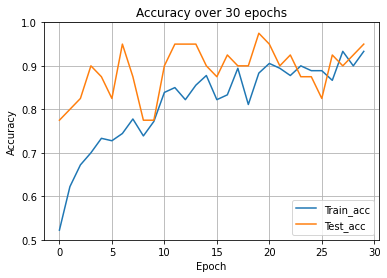

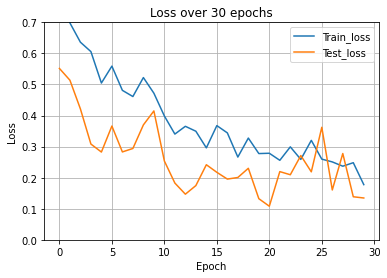

In [23]:
import matplotlib.pyplot as plt

plt.figure(1)
plt.plot(history.history['accuracy'], label='Train_acc')
plt.plot(history.history['val_accuracy'], label = 'Test_acc')
plt.title("Accuracy over 30 epochs")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
plt.grid()


plt.figure(2)
plt.plot(history.history['loss'], label='Train_loss')
plt.plot(history.history['val_loss'], label = 'Test_loss')
plt.title("Loss over 30 epochs")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim([0, 0.7])
plt.legend(loc='upper right')
plt.grid()

plt.show()

Found 66 images belonging to 2 classes.
66/66 [==============================] - 6s 92ms/step
np/0100.png


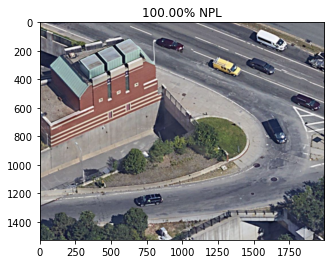

np/03.png


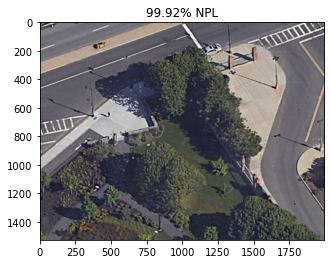

np/057.png


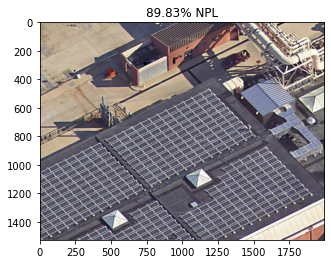

np/059.png


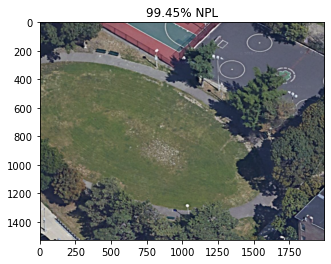

np/060.png


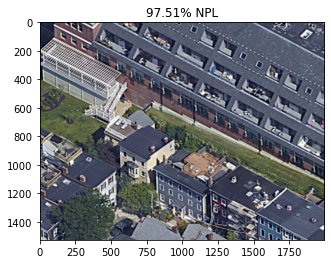

np/095.png


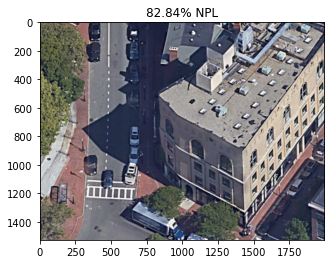

np/104.jpg


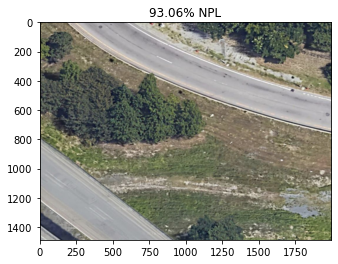

np/107.jpg


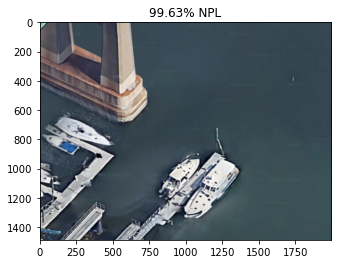

np/108.jpg


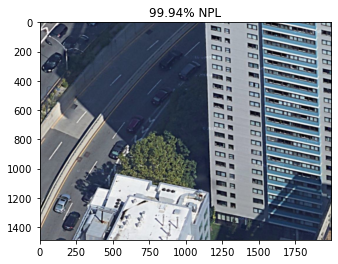

np/123.jpg


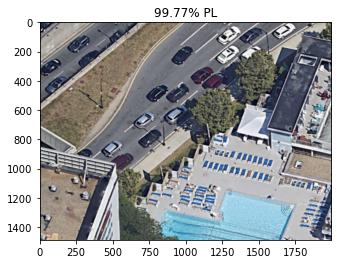

np/147.jpg


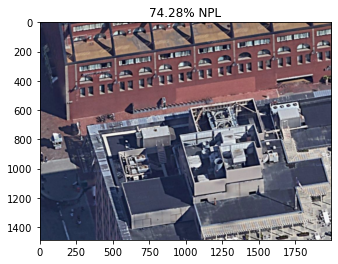

np/251.jpg


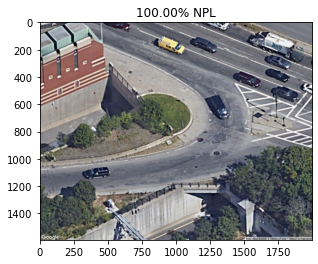

np/254.jpg


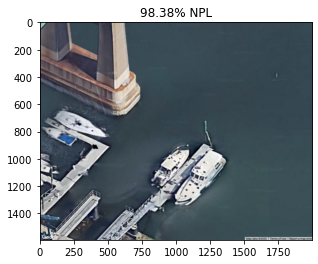

np/285.jpg


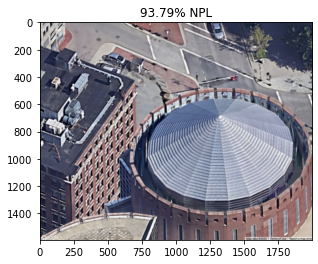

np/300.jpg


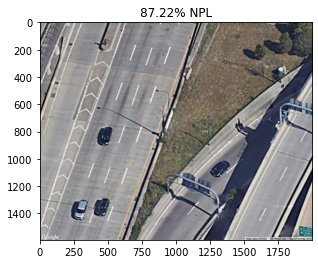

np/383.jpg


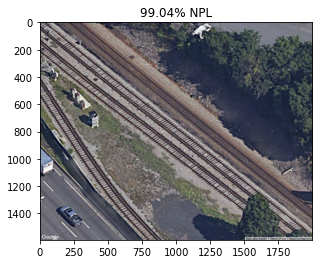

np/405.jpg


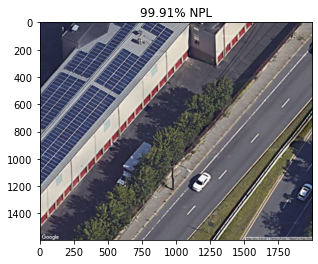

np/418.jpg


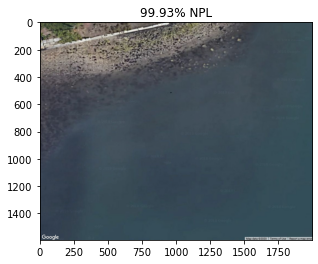

np/426.jpg


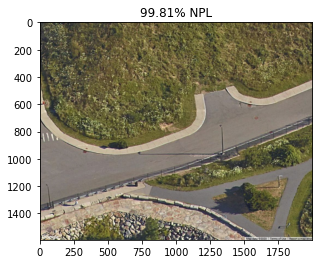

np/435.jpg


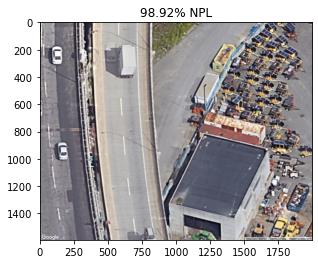

np/536.jpg


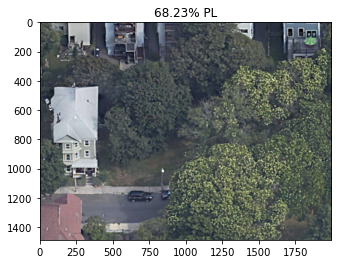

np/541.jpg


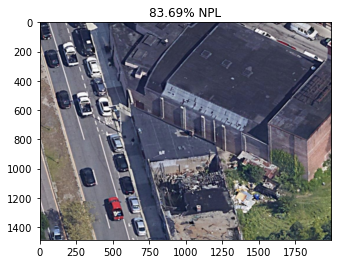

np/555.jpg


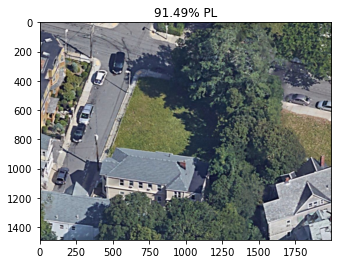

np/558.jpg


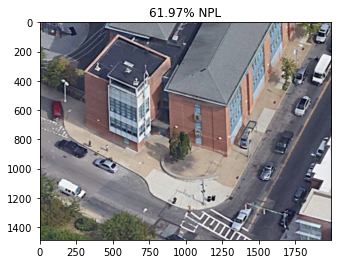

np/560.jpg


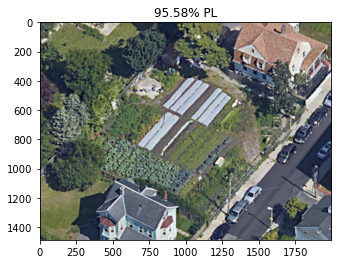

np/564.jpg


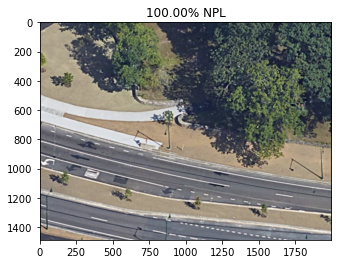

np/590.jpg


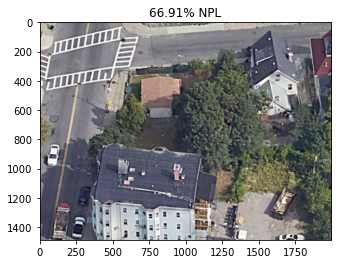

np/615.jpg


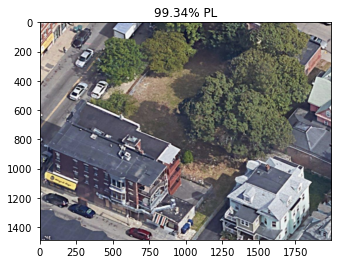

np/707.jpg


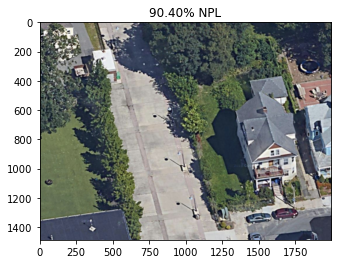

np/767.jpg


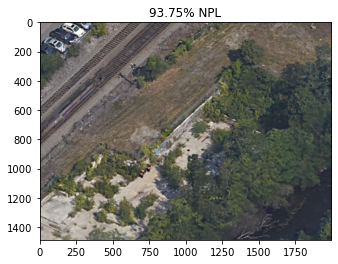

np/794.jpg


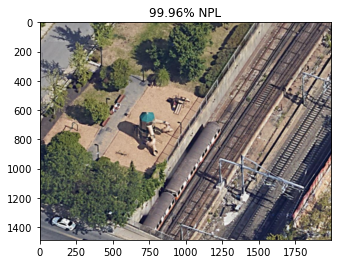

np/862.jpg


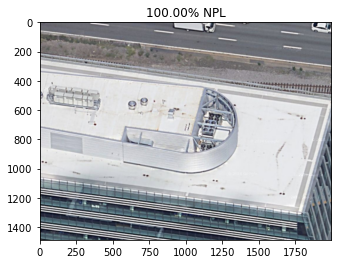

np/863.jpg


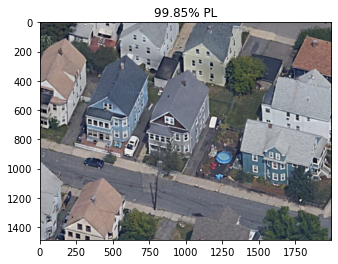

np/865.jpg


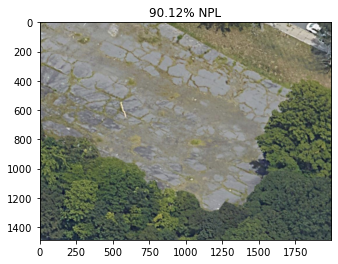

p/018.png


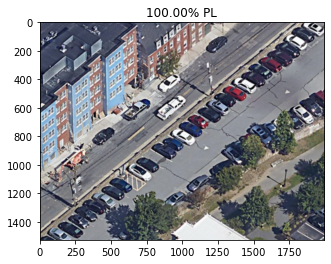

p/022.png


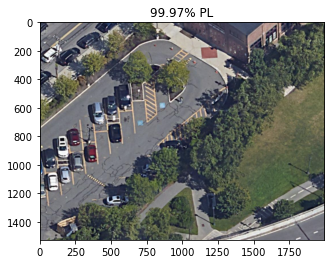

p/027.png


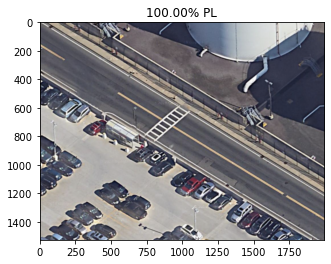

p/045.png


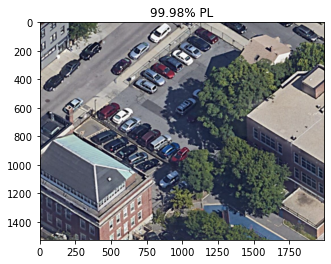

p/047.png


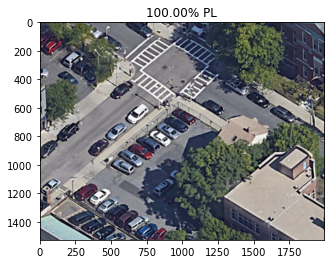

p/070.png


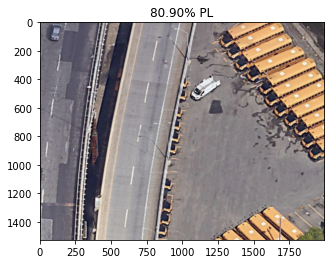

p/085.png


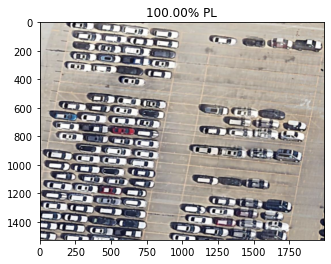

p/1.jpg


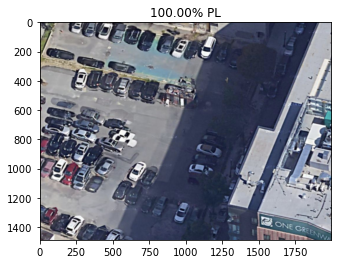

p/105.jpg


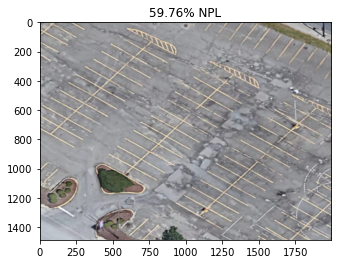

p/1200px-Car_park_-8.jpg


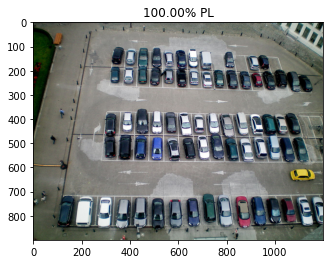

p/19800660_web1_OakBayPoliceBriefs_1.jpg


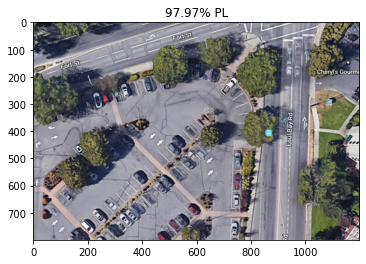

p/240.jpg


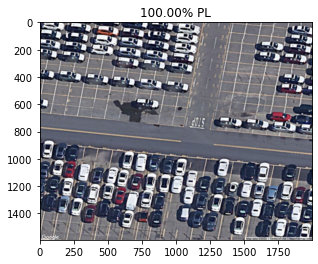

p/253.jpg


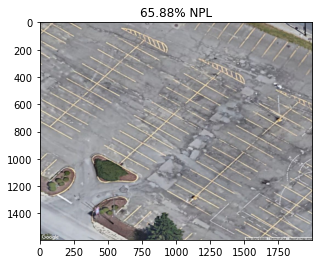

p/323.jpg


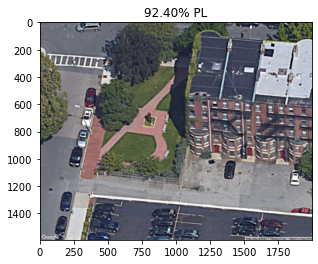

p/326.jpg


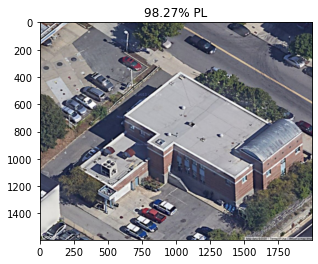

p/361.jpg


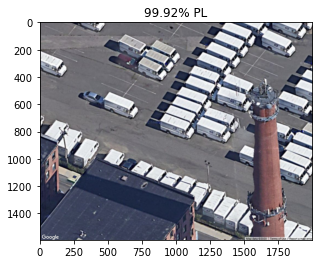

p/4.jpg


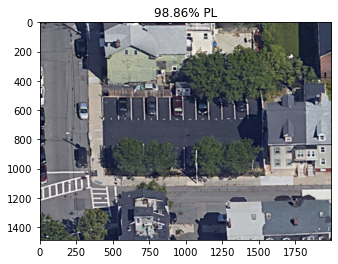

p/417.jpg


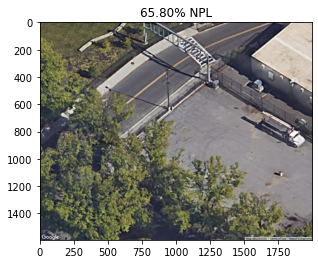

p/422.jpg


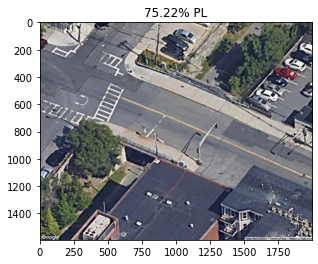

p/585.jpg


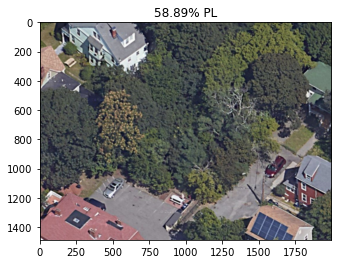

p/5b9fe6a6-539f-4b36-9f0b-8de8ce01de93-20190412DRONEircParking02.jpeg


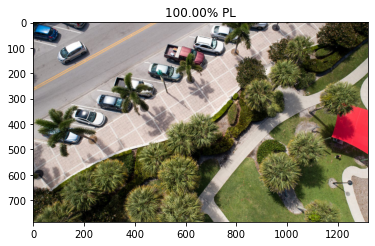

p/659.jpg


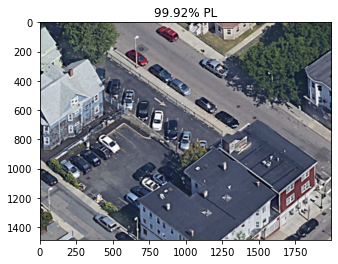

p/660.jpg


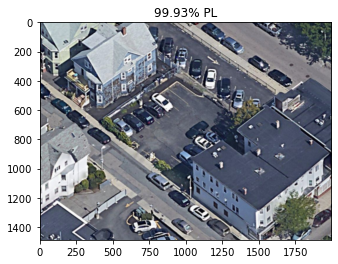

p/674.jpg


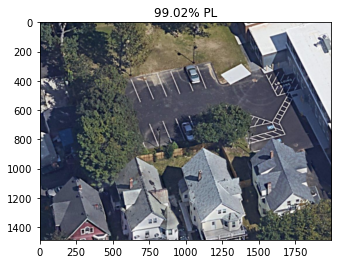

p/685.jpg


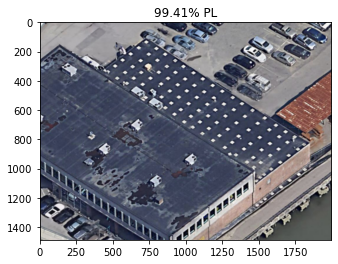

p/711.jpg


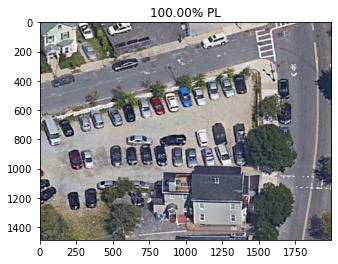

p/754.jpg


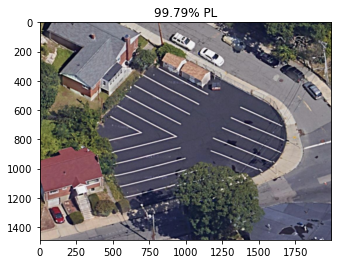

p/827.jpg


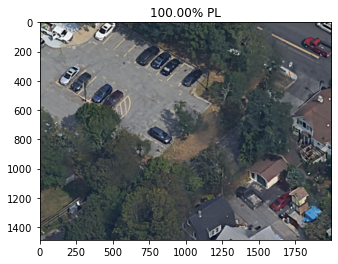

p/839.jpg


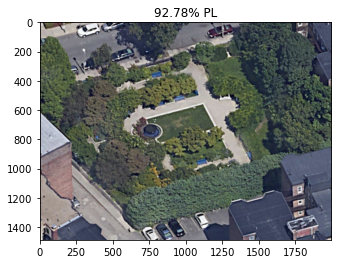

p/840.jpg


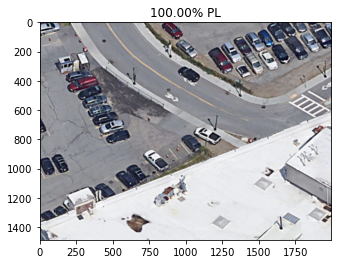

p/842.jpg


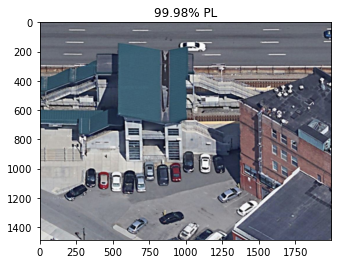

p/861.jpg


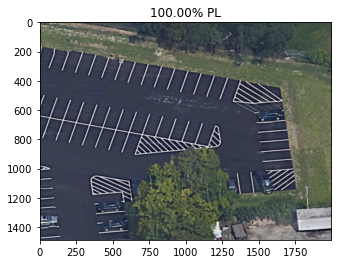

In [10]:
import matplotlib.image as mpimg
from tensorflow.keras.models import load_model

#model = tf.keras.models.load_model('saved_model/my_model_new')

model = tf.keras.models.load_model('my_model.h5')


test_datagen = ImageDataGenerator(rescale=1. / 255)
eval_generator = test_datagen.flow_from_directory(TEST_DIR,target_size=IMAGE_SIZE,
                                                  batch_size=1,shuffle=False,seed=42,class_mode="binary")

p = model.evaluate_generator(eval_generator,66,verbose=1)

eval_generator.reset()
pred = model.predict_generator(eval_generator,66,verbose=1)

for index, probability in enumerate(pred):
    image_path = TEST_DIR + "/" +eval_generator.filenames[index]
    image = mpimg.imread(image_path)
    if image.ndim < 3:
        image = np.reshape(image,(image.shape[0],image.shape[1],1))
        image = np.concatenate([image, image, image], 2)
#         print(image.shape)

    pixels = np.array(image)
    plt.imshow(pixels)
    
    print(eval_generator.filenames[index])
    if probability > 0.5:
        plt.title("%.2f" % (probability[0]*100) + "% PL")
    else:
        plt.title("%.2f" % ((1-probability[0])*100) + "% NPL")
    plt.show()